# Noise Crystal & Liquid Noise Demos

In [1]:
from liquidnoise import *
import glob
import warnings

warnings.filterwarnings('ignore')

model = Model()
ldm_stable = model.ldm_stable
seed = 1

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["id2label"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["bos_token_id"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["eos_token_id"]` will be overriden.


## Prompt-to-Video

### Noise Crystallization

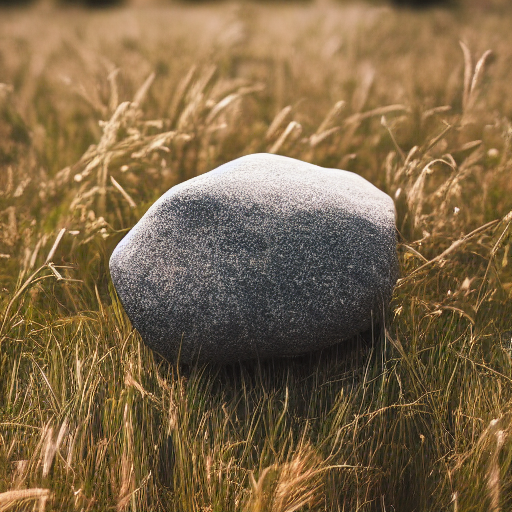

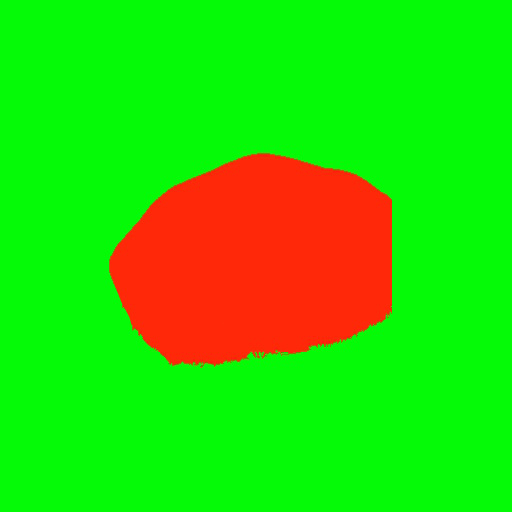

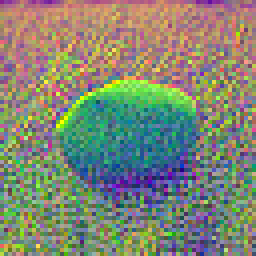

Creating animation: 100%|██████████| 16/16 [00:26<00:00,  1.64s/frame]


saved as output/roll697.gif


'output/roll697.gif'

In [2]:
prompt = "Photo of a rock in a field of grass"
control_image = Image.open("control/control_image_seed_1.jpg")
create_animation(ldm_stable, prompt, control_image, stop=16, switch_percent=75, noise_anim="pan", control_anim="pan", num_inference_steps=20, guidance_scale=8, cond_scale=1.0)

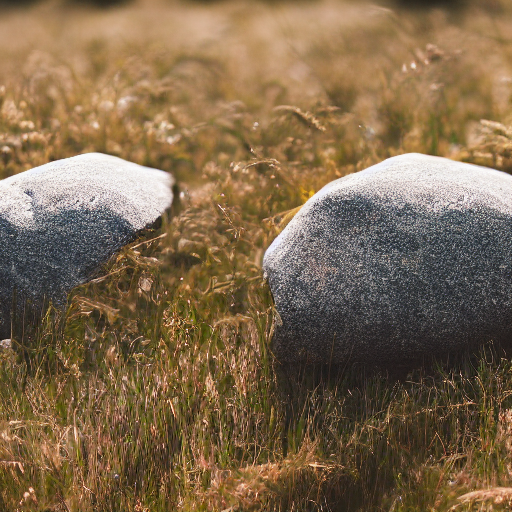

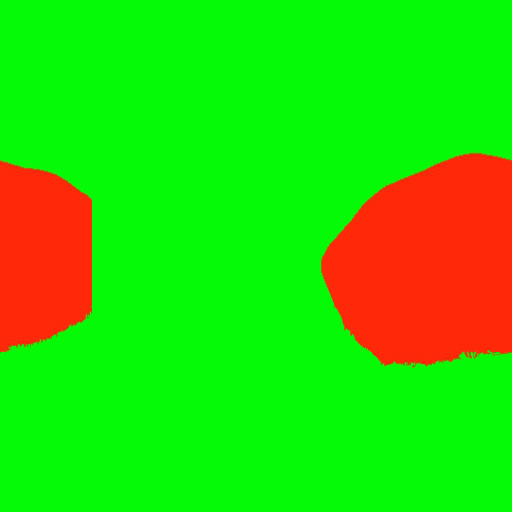

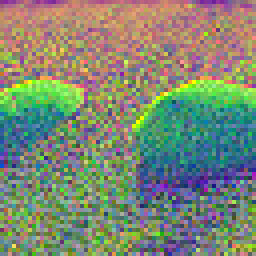

Creating animation: 100%|██████████| 16/16 [00:25<00:00,  1.58s/frame]


saved as output/roll7987.gif


'output/roll7987.gif'

In [3]:
prompt = "Photo of a rock in a field of grass"
control_image = Image.open("control/control_image_seed_1.jpg")
noise_mask = Image.open("control/rock_noise_mask.png").convert('L')
create_animation(ldm_stable, prompt, control_image, mask=noise_mask, stop=16, switch_percent=75, noise_anim="parallax", control_anim="perspective", num_inference_steps=20, guidance_scale=8, cond_scale=1.0)

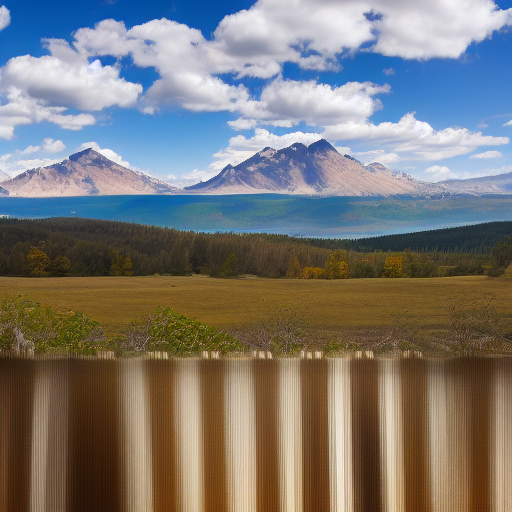

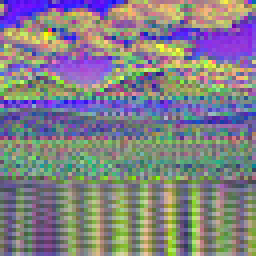

63
saved as output/roll9594.gif


In [13]:
prompt = "Vista of mountains and lake and trees, with clear blue sky and wooden fence in foreground"
control_image = Image.open("control/control_image_vista.jpg").convert('RGB')
create_animation(ldm_stable, prompt, control_image, None, start=0, stop=64, switch_percent=50, fps=10, noise_anim="parallaxV", control_anim="perspectiveV", num_inference_steps=20, guidance_scale=8, cond_scale=1.2)

### Liquid Noise

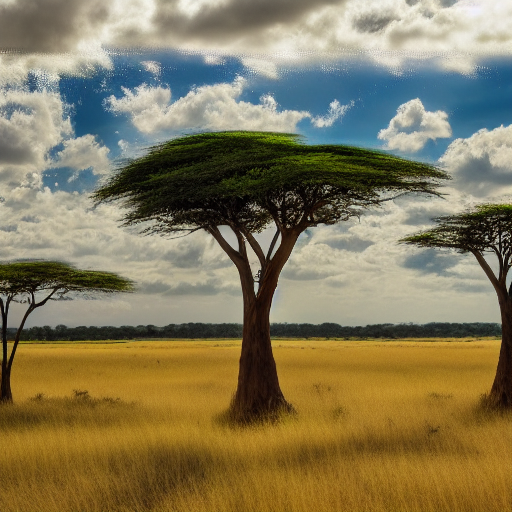

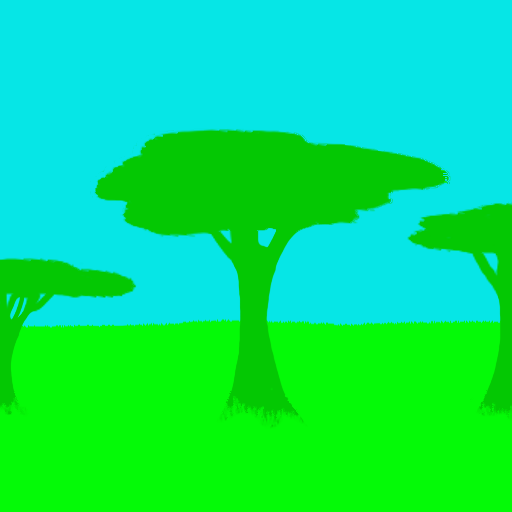

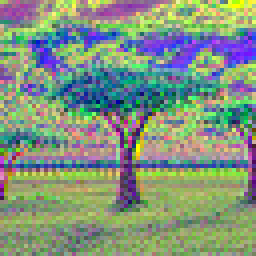

Creating animation: 100%|██████████| 19/19 [00:38<00:00,  2.01s/frame]


saved as output/roll5855.gif


'output/roll5855.gif'

In [4]:
prompt = "Acacia trees in the savannah, long grass, sky with small clouds"
control_image = Image.open("control/sway_control.png").convert('RGB')
flow = Image.open("control/sway_flow.png").convert('RGB')

create_animation(ldm_stable, prompt, control_image, flow, None, wrap=False, start=0, stop=19, switch_percent=70, noise_anim="flow", control_anim="flow", seed=3)
# create_animation(ldm_stable, prompt, control_image, flow, None, wrap=False, start=0, stop=19, switch_percent=70, noise_anim="noising", control_anim="flow", seed=1)

# create_animation(ldm_stable, prompt, control_image, None, None, wrap=False, start=0, stop=8, switch_percent=70, noise_anim="zoom", seed=3)
# create_animation(ldm_stable, prompt, control_image, None, None, wrap=False, start=0, stop=8, switch_percent=70, noise_anim="rotate", seed=3)

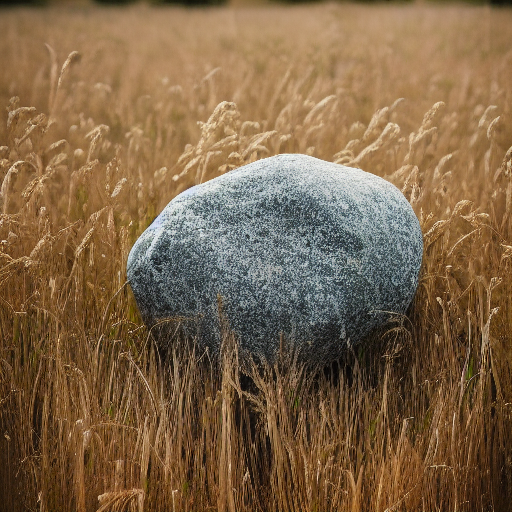

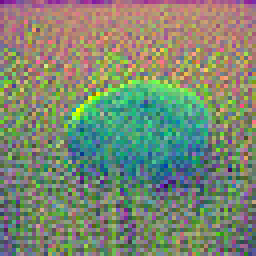

frame:  15
saved as output/roll7178.gif


In [201]:
prompt = "A photo of a rock in a field of grass"
control_image = Image.open("control/control_image_rock_2.png").convert('RGB')
flow = Image.open("control/pan_flow.png").convert('RGB')
# create_animation(ldm_stable, prompt, control_image, None, None, wrap=True, start=0, stop=8, switch_percent=75, noise_anim="upscale", control_anim="pan_small", seed=1)
# create_animation(ldm_stable, prompt, control_image, None, None, wrap=True, start=0, stop=16, switch_percent=30, noise_anim="vae_interp", control_anim="pan_small", seed=1)
create_animation(ldm_stable, prompt, control_image, flow, None, wrap=True, start=0, stop=16, switch_percent=80, noise_anim="flow", control_anim="pan_small", seed=1)

## Image-to-Video

### Single Layer

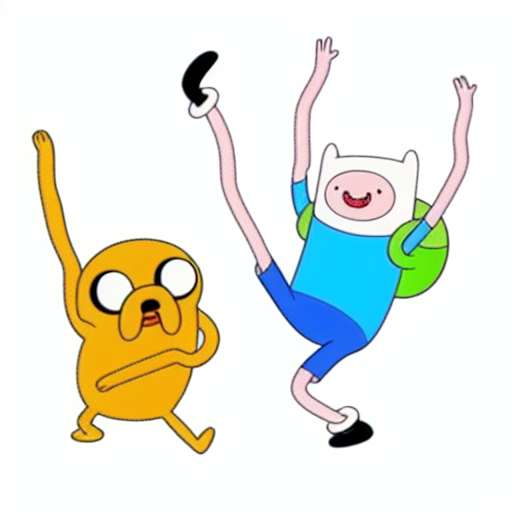

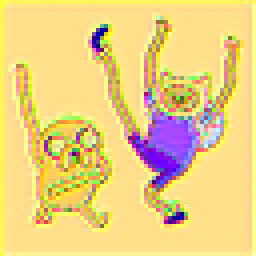

frame:  15
saved as output/roll549.gif


In [4]:
prompt = "Adventure time Finn and Jake"
image = Image.open("control/adventure_time.png")
flow = Image.open("control/adventure_flow.png").convert('RGB')
create_animation(ldm_stable, prompt, flows=flow, images=image, stop=16, switch_percent=65, noise_anim="flow", seed=1)

### Many Layers

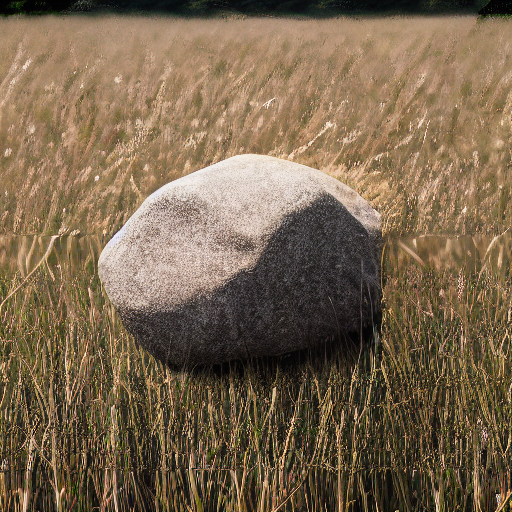

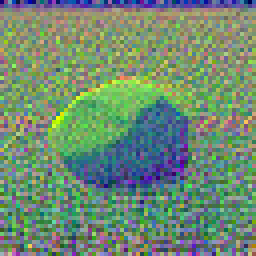

frame:  15
saved as output/roll1872.gif


In [220]:
prompt = "Photo of a rock in a field of grass"
bg = Image.open("control/grass_grass.png").convert('RGBA')
fg = Image.open("control/rock_transparent.png").convert('RGBA')
flow_bg = Image.open("control/grass_grass_flow_2.png").convert('RGB')
flow_fg = Image.open("control/rock_transparent_flow.png").convert('RGB')

create_animation(ldm_stable, prompt, flows=[flow_bg, flow_fg], images=[bg, fg], start=0, stop=16, switch_percent=95, noise_mult=3, noise_anim="flow", seed=1)

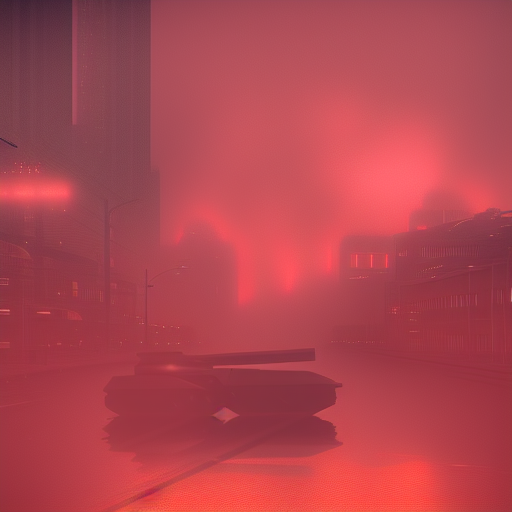

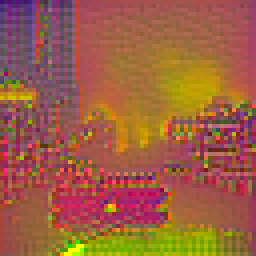

Creating animation: 100%|██████████| 32/32 [00:33<00:00,  1.06s/frame]


saved as output/roll6966.gif


'output/roll6966.gif'

In [5]:
prompt = "Film still of a scifi tank in foggy red city"
images = []
images.append(Image.open("control/red_city_bg.png").convert('RGBA'))
images.append(Image.open("control/red_city_tank.png").convert('RGBA'))
images.append(Image.open("control/red_city_fog.png").convert('RGBA'))
flows = []
flows.append(Image.open("control/red_city_bg_flow.png").convert('RGB'))
flows.append(Image.open("control/red_city_tank_flow.png").convert('RGB'))
flows.append(Image.open("control/red_city_fog_flow.png").convert('RGB'))

create_animation(ldm_stable, prompt, flows=flows, images=images, start=0, stop=32, switch_percent=90, noise_anim="flow", fps=9.5, seed=5)

## Video-to-Video

In [ ]:
video_style_transfer(ldm_stable, "Pixar 3D woman in sunglasses walking in Tokyo", "control/tokyo_walk.mp4", percent=60)

## Seamless Upscaling

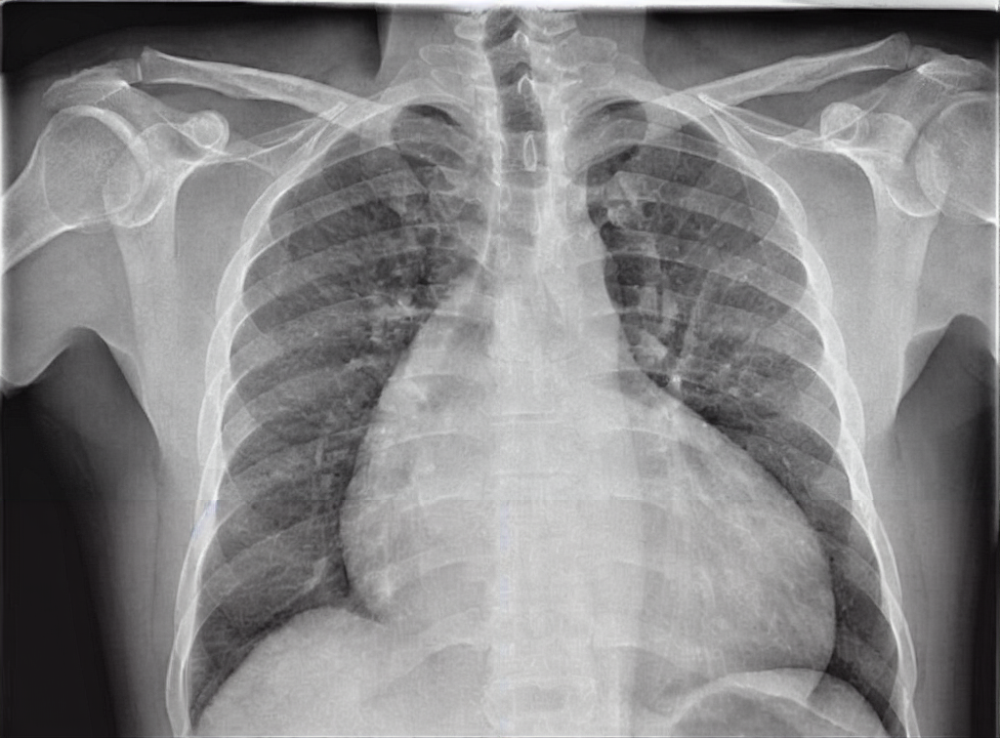

In [2]:
image = Image.open("control/xray_input_3.png").convert('RGB')
upscale_and_stitch(ldm_stable, image, mult=2, seamless=True)

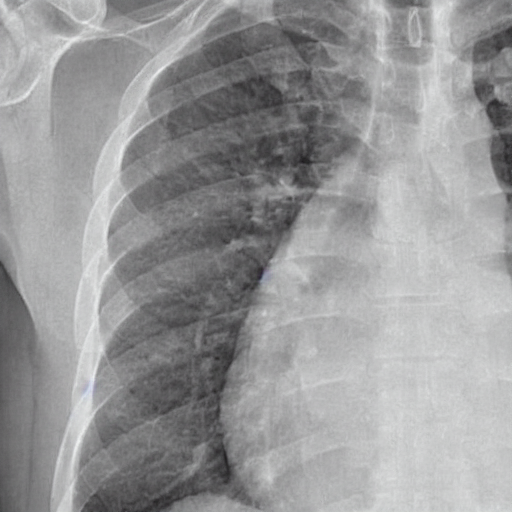

In [8]:
image = Image.open("control/xray_input_3.png").convert('RGB')
magnifying_glass(ldm_stable, image, coords=(64, 64), mult=2, seed=1, seamless=True)
# magnifying_glass(ldm_stable, image, coords=(64, 64), mult=2, seed=1, seamless=False)

## Relighting

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

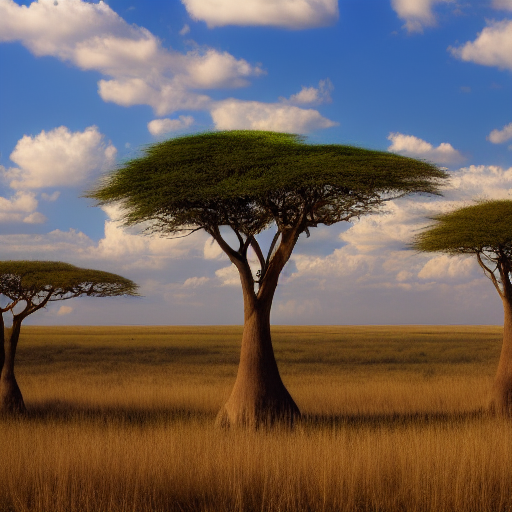

In [6]:
prompt = "Acacia trees in the savannah, long grass, sky with small clouds"
# prompt = "Trees savannah, grass, sky"
control_image = Image.open("control/sway_control.png").convert('RGB')
noise_mask = Image.open("control/tree_noise_mask.png").convert('L')
view_image(combine_latents(ldm_stable, seed_bg=5, seed_fg=3, prompt=prompt, mask=noise_mask, control=control_image, percent=20))

## Latent Space Colour Correction

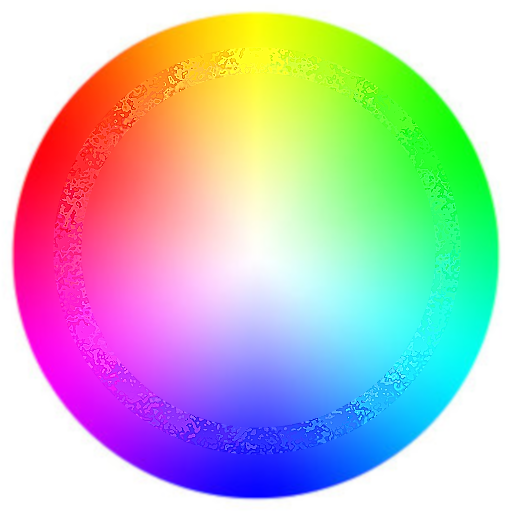

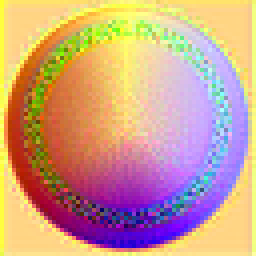

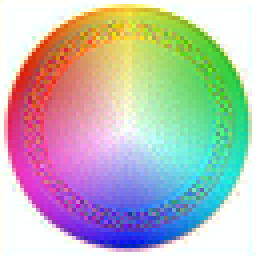

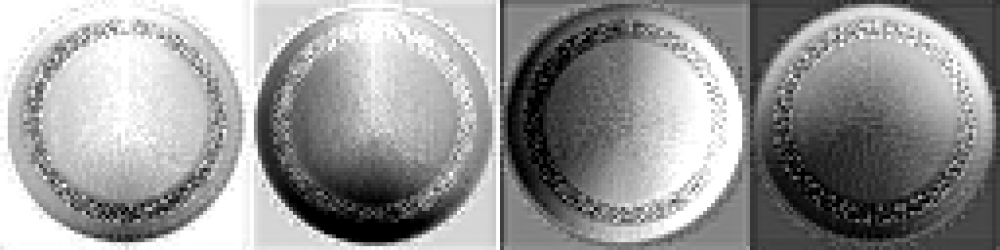

In [4]:
colours = Image.open("control/colour wheel.png")
latent = ptp_utils.image2latent(ldm_stable.vae, np.array(colours))
display(colours)
view_noise(latent)
display(latents_to_rgb(latent))
view_noise_channels(latent)

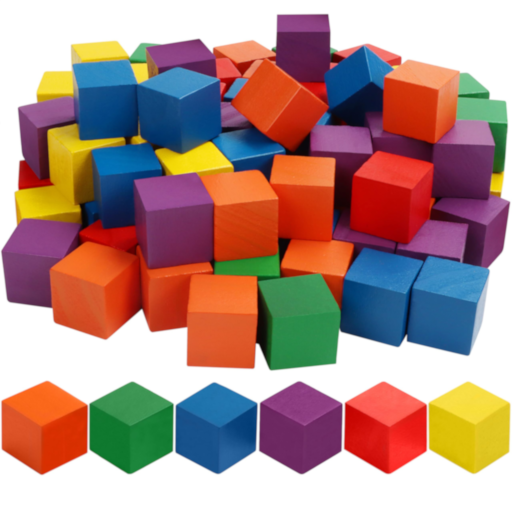

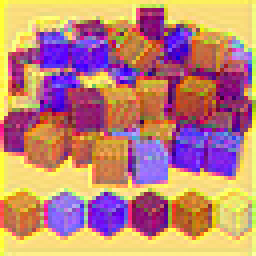

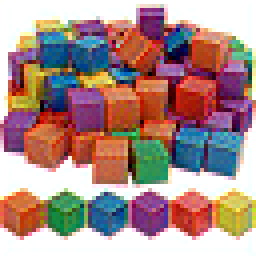

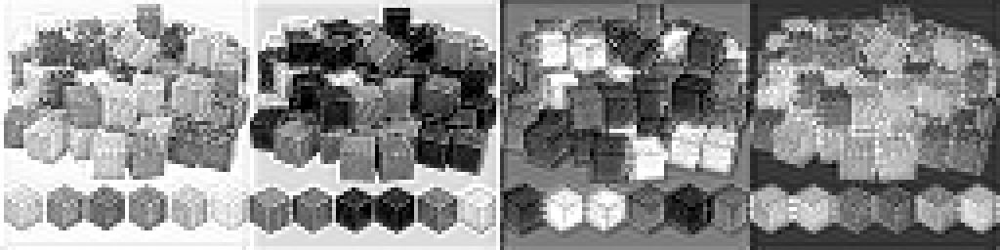

In [5]:
colours = Image.open("control/colours.png")
display(colours)
latent = ptp_utils.image2latent(ldm_stable.vae, np.array(colours))
view_noise(latent)
display(latents_to_rgb(latent))
view_noise_channels(latent)

## Eval

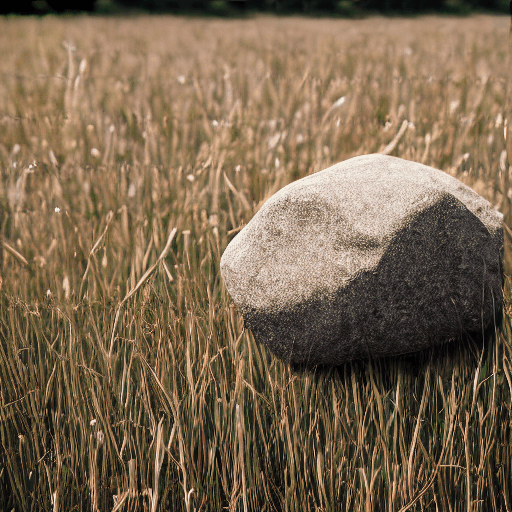

16


0.8228893044727954


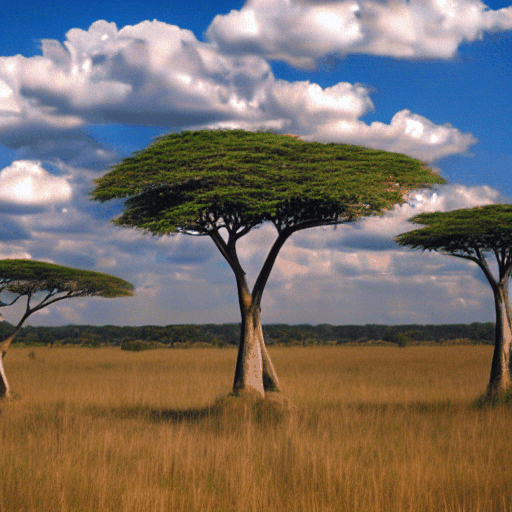

16


0.8794768198273746


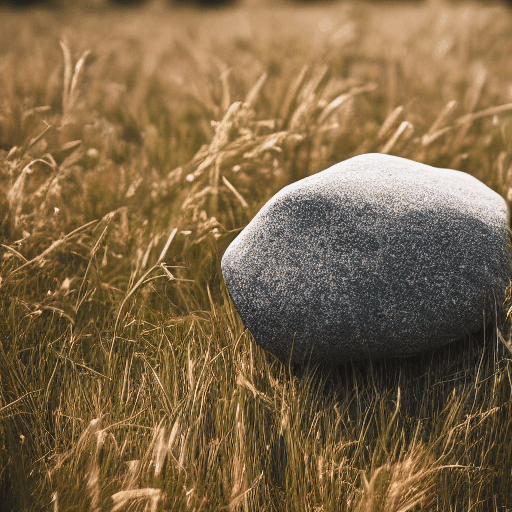

19


0.8381352699018189


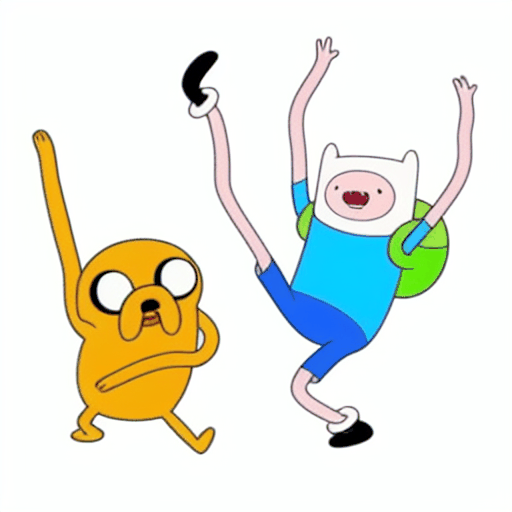

16


0.9397036292888498


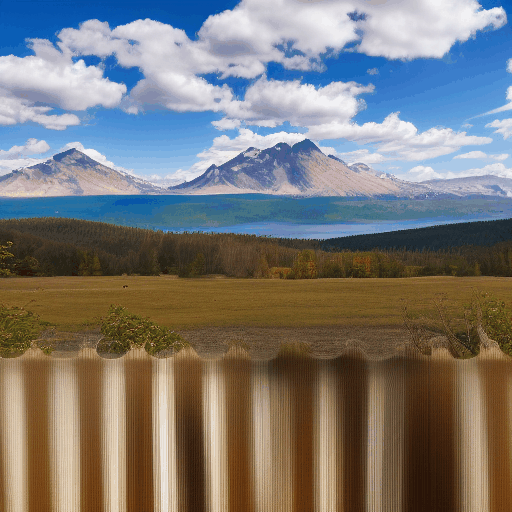

64


0.6314403357590461


In [6]:
folder = "eval/liquidnoise/"
files = glob.glob(folder + "*.*")
for file in files:
	values = []
	imgs = convert_to_img_seq(file)
	display(imgs[1])
	print(len(imgs))
	for line in [50, 150, 250, 350, 450]:
		X_T = X_T_slices(file, line=line, thickness=1)
		display(X_T)
		values.append(temporal_smoothness_metric(np.array(X_T)))
	print(np.mean(values))

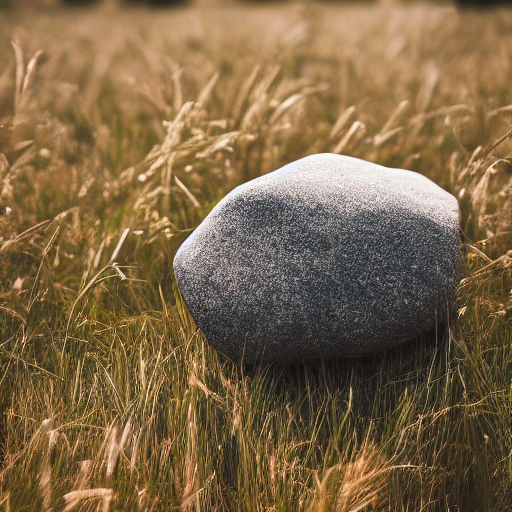

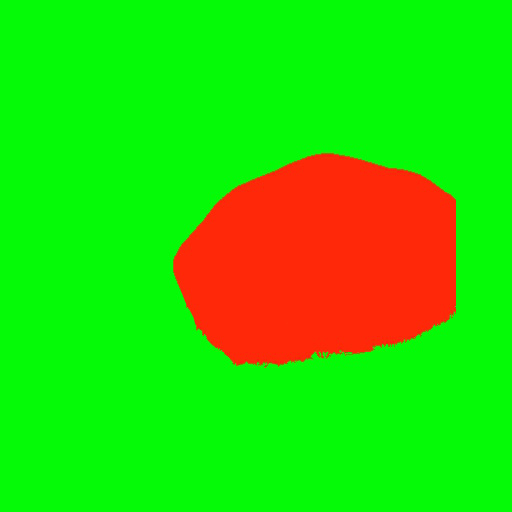

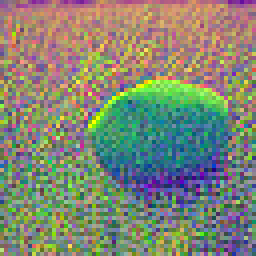

frame:  7


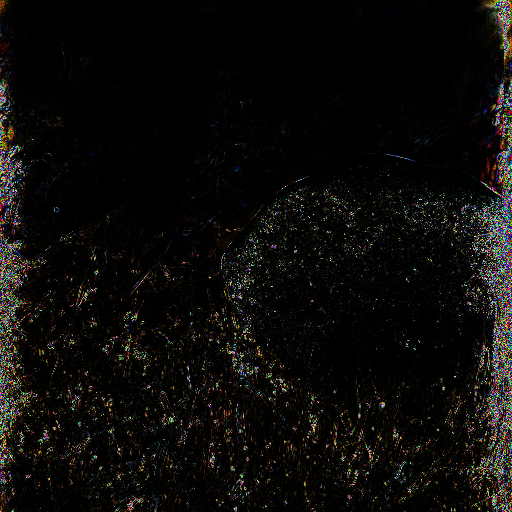

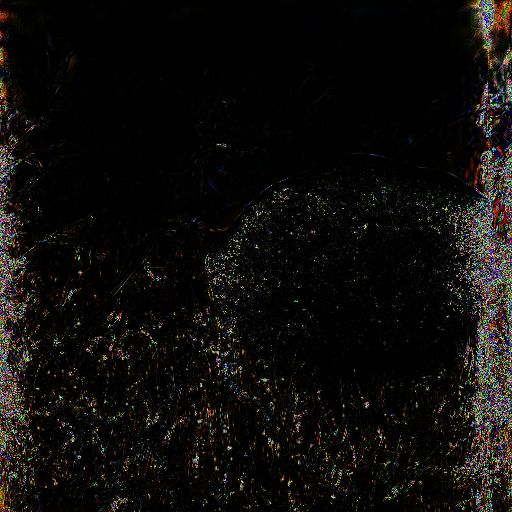

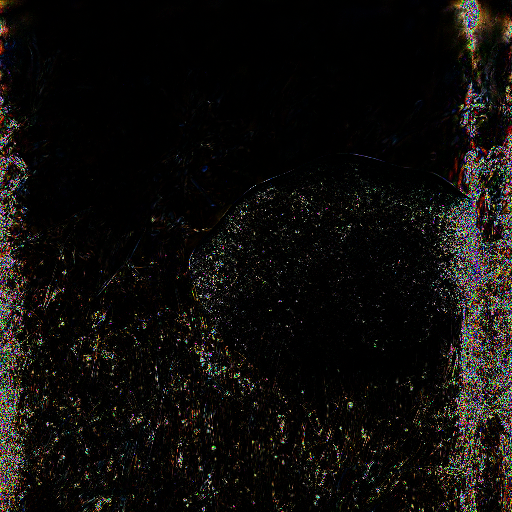

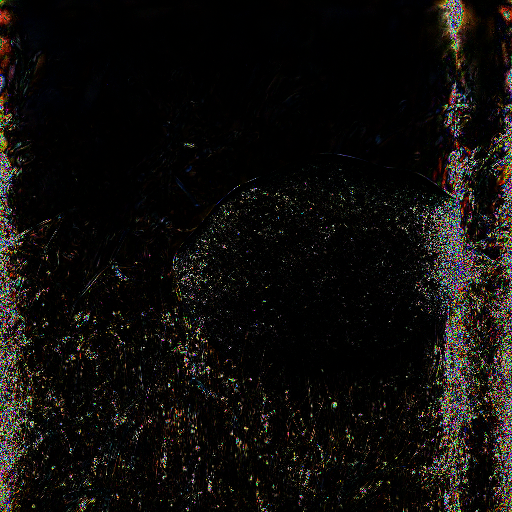

46.90818368820917


In [7]:
prompts = ["Photo of a rock in a field of grass"]
control_image = Image.open("control/control_image_seed_1.jpg")
flow_image = Image.open("control/pan_flow.png").convert("RGB")
gif = create_animation(ldm_stable, prompts, control_image, None, start=0, stop=8, switch_percent=90, noise_anim="pan", control_anim="pan", cond_scale=1.0, seed=1, save=False)
# gif = create_animation(ldm_stable, prompts, None, None, start=0, stop=8, switch_percent=90, noise_anim="pan", control_anim="None", cond_scale=1.0, seed=1, save=False)
# gif = create_animation(ldm_stable, prompts, control_image, flow_image, start=0, stop=8, switch_percent=75, noise_anim="flow", control_anim="flow", cond_scale=1.0, seed=1, save=False)
# print(MSE_over_frames(gif, flow=flow_image))
print(MSE_over_frames(gif, speed=8))

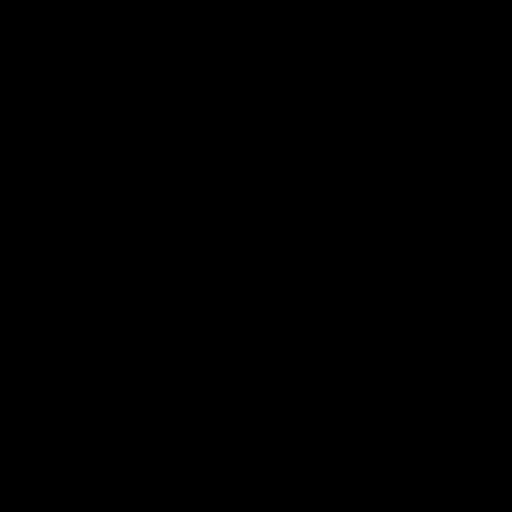

15.747300704320272

In [10]:
path = "control/xray_input_2.png"
x_coords = [64, 128, 192, 256]
y_coords = [64, 128, 192, 256]
# MSE_upscale(path, x_coords, y_coords, mult=2, seamless=True)
MSE_upscale(ldm_stable, path, x_coords, y_coords, mult=2, seamless=False)